In [1]:
import os
import random
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.utils import plot_model
from sklearn.model_selection import train_test_split

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
if (tf.test.is_gpu_available):
    print("GPU")
else:
    print("CPU")

GPU


In [3]:
from tensorflow.python.client import device_lib

device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 10949261038693329584
 xla_global_id: -1,
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 16120545280
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 15282144253216225845
 physical_device_desc: "device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0"
 xla_global_id: 416903419]

In [4]:
def load_dataset(dataset_root):
    classes = sorted([cls for cls in os.listdir(dataset_root) if os.path.isdir(os.path.join(dataset_root, cls))])
    x = []
    y = []
    for i, cls in enumerate(classes):
        cls_images = sorted(os.listdir(os.path.join(dataset_root, cls)))
        x.extend([os.path.join(dataset_root, cls, img) for img in cls_images])
        y.extend([i] * len(cls_images))
    return x, y

In [5]:
# Load your dataset
dataset_root = '/kaggle/input/facedatasets'  # Replace with the path to your dataset
x, y = load_dataset(dataset_root)

# Split the dataset into training, validation, and test sets
x_train, x_temp, y_train, y_temp = train_test_split(x, y, test_size=0.2, random_state=42)
x_val, x_test, y_val, y_test = train_test_split(x_temp, y_temp, test_size=0.5, random_state=42)

In [6]:
print("Number of images:", len(x))
print("Some image paths:", x[:5])
print("Corresponding labels:", y[:5])

Number of images: 8204
Some image paths: ['/kaggle/input/facedatasets/0/0.jpg', '/kaggle/input/facedatasets/0/1.jpg', '/kaggle/input/facedatasets/0/2.jpg', '/kaggle/input/facedatasets/0/3.jpg', '/kaggle/input/facedatasets/1/0.jpg']
Corresponding labels: [0, 0, 0, 0, 1]


In [7]:
def create_pairs(x, y):
    pair_images = []
    pair_labels = []

    class_indices = dict((c, [i for i, label in enumerate(y) if label == c]) for c in set(y))

    for idx, (img_path, label) in enumerate(zip(x, y)):
        # Add a positive pair
        positive_options = class_indices[label]
        if len(positive_options) > 1:  # Ensure there is more than one image in the class
            positive_idx = idx
            while positive_idx == idx:
                positive_idx = random.choice(positive_options)
            pair_images.append([img_path, x[positive_idx]])
            pair_labels.append(1)

        # Add a negative pair
        negative_labels = list(set(y) - set([label]))
        if negative_labels:  # Ensure there is at least one other class
            negative_label = random.choice(negative_labels)
            negative_idx = random.choice(class_indices[negative_label])
            pair_images.append([img_path, x[negative_idx]])
            pair_labels.append(0)

    return pair_images, pair_labels

In [8]:
# make train pairs
pairs_train, labels_train = create_pairs(x_train, y_train)

In [9]:
print(pairs_train[:10], labels_train[:10])

[['/kaggle/input/facedatasets/41/1.jpg', '/kaggle/input/facedatasets/41/2.jpg'], ['/kaggle/input/facedatasets/41/1.jpg', '/kaggle/input/facedatasets/881/2.jpg'], ['/kaggle/input/facedatasets/893/1.jpg', '/kaggle/input/facedatasets/893/0.jpg'], ['/kaggle/input/facedatasets/893/1.jpg', '/kaggle/input/facedatasets/1091/1.jpg'], ['/kaggle/input/facedatasets/1467/13.jpg', '/kaggle/input/facedatasets/1467/39.jpg'], ['/kaggle/input/facedatasets/1467/13.jpg', '/kaggle/input/facedatasets/424/0.jpg'], ['/kaggle/input/facedatasets/1127/0.jpg', '/kaggle/input/facedatasets/1127/4.jpg'], ['/kaggle/input/facedatasets/1127/0.jpg', '/kaggle/input/facedatasets/1645/6.jpg'], ['/kaggle/input/facedatasets/891/0.jpg', '/kaggle/input/facedatasets/891/1.jpg'], ['/kaggle/input/facedatasets/891/0.jpg', '/kaggle/input/facedatasets/505/0.jpg']] [1, 0, 1, 0, 1, 0, 1, 0, 1, 0]


In [10]:
# make validation pairs
pairs_val, labels_val = create_pairs(x_val, y_val)

In [11]:
# make test pairs
pairs_test, labels_test = create_pairs(x_test, y_test)

In [12]:
import matplotlib.pyplot as plt
from PIL import Image

def visualize(pairs, labels, to_show=6, num_col=3, predictions=None, test=False):
    """Visualizes pairs of images with labels (and predictions, if test dataset)."""
    num_row = to_show // num_col if to_show // num_col != 0 else 1
    to_show = num_row * num_col

    fig, axes = plt.subplots(num_row, num_col, figsize=(5 * num_col, 5 * num_row))
    for i in range(to_show):
        if num_row == 1:
            ax = axes[i % num_col]
        else:
            ax = axes[i // num_col, i % num_col]

        # Load images
        img1 = Image.open(pairs[i][0])
        img2 = Image.open(pairs[i][1])

        # Concatenate images
        combined_img = Image.new('RGB', (img1.width + img2.width, img1.height))
        combined_img.paste(img1, (0, 0))
        combined_img.paste(img2, (img1.width, 0))

        ax.imshow(combined_img)
        ax.set_axis_off()

        if test:
            ax.set_title("True: {} | Pred: {:.5f}".format(labels[i], predictions[i][0]))
        else:
            ax.set_title("Label: {}".format(labels[i]))

    plt.tight_layout()
    plt.show()

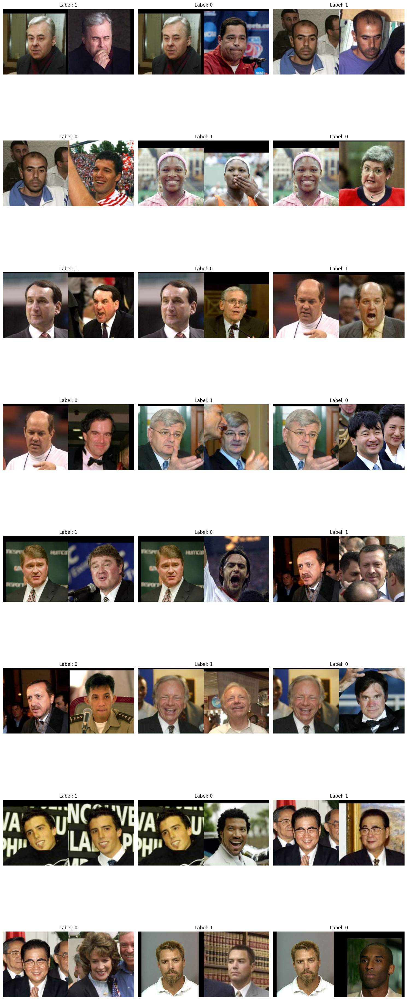

In [13]:
visualize(pairs_train, labels_train, to_show=24, num_col=3)

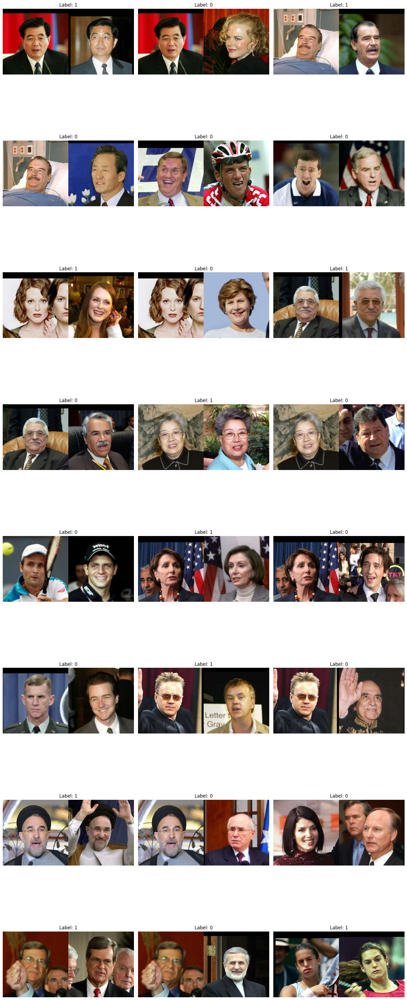

In [14]:
visualize(pairs_val, labels_val, to_show=24, num_col=3)

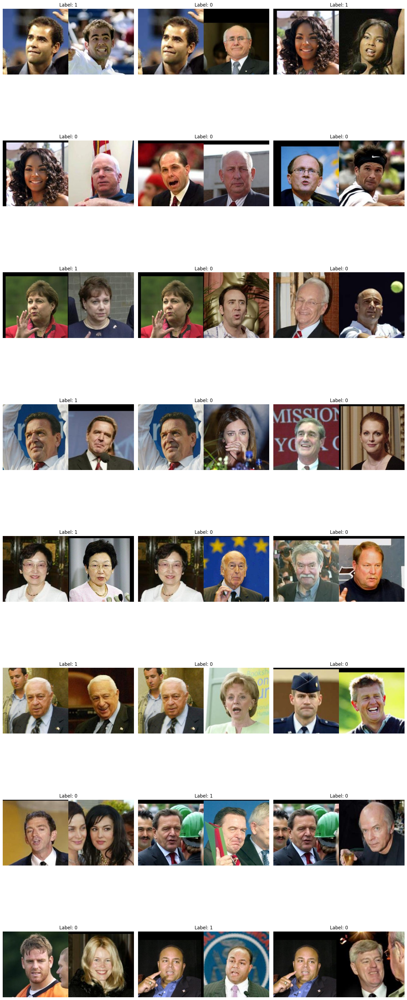

In [15]:
visualize(pairs_test, labels_test, to_show=24, num_col=3)

In [16]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, applications, regularizers

# Euclidean distance function remains the same
def euclidean_distance(vects):
    x, y = vects
    sum_square = tf.math.reduce_sum(tf.math.square(x - y), axis=1, keepdims=True)
    return tf.math.sqrt(tf.math.maximum(sum_square, tf.keras.backend.epsilon()))

# Modified embedding network using a pre-trained model (e.g., MobileNet)
def create_embedding_network(input_shape):
    base_model = applications.MobileNetV2(input_shape=input_shape, include_top=False, weights='imagenet', pooling='avg')
    
    base_model.trainable = True
    # Optional: Fine-tuning - freeze layers except the last few
    for layer in base_model.layers[:-4]:
        layer.trainable = False

    model = keras.Sequential([
        base_model,
        layers.Dense(512, activation="relu"),
        layers.Dropout(0.5),
        layers.Dense(64, activation="relu")
    ], name='Embedding')
    
    return model

input_shape = (250, 250, 3)
embedding_network = create_embedding_network(input_shape)

input_1 = layers.Input(shape=input_shape)
input_2 = layers.Input(shape=input_shape)

tower_1 = embedding_network(input_1)
tower_2 = embedding_network(input_2)

merge_layer = layers.Lambda(lambda tensors: tf.math.abs(tensors[0] - tensors[1]))([tower_1, tower_2])
output_layer = layers.Dense(1, activation="sigmoid")(merge_layer)

siamese = keras.Model(inputs=[input_1, input_2], outputs=output_layer)

# Computing the Euclidean distance as output
#distance = layers.Lambda(euclidean_distance)([tower_1, tower_2])

# Creating the model
#siamese = keras.Model(inputs=[input_1, input_2], outputs=distance)

9406464/9406464 [==============================] - 1s 0us/step


In [17]:
import tensorflow as tf

def contrastive_loss(margin=1):
    def loss(y_true, y_pred):
        y_true = tf.cast(y_true, tf.float32)
        square_pred = tf.square(y_pred)
        margin_square = tf.square(tf.maximum(margin - y_pred, 0))
        return tf.reduce_mean((1 - y_true) * square_pred + y_true * margin_square)
    return loss

In [18]:
import numpy as np
from PIL import Image
import tensorflow as tf

def preprocess_image(image_path, target_size=(250, 250)):
    """Preprocess a single image with augmentation."""
    image = Image.open(image_path)
    image = image.resize(target_size)
    image = np.array(image)

    # Convert image to a tf.Tensor to use tf.image functions
    image = tf.convert_to_tensor(image, dtype=tf.float32)

    # Apply a sequence of augmentations
    image = tf.image.random_flip_left_right(image)  # Random horizontal flip
    image = tf.image.random_flip_up_down(image)     # Random vertical flip
    image = tf.image.random_brightness(image, max_delta=0.3)  # Random brightness
    image = tf.image.random_contrast(image, lower=0.8, upper=1.2) # Random contrast
    image = tf.image.random_saturation(image, lower=0.8, upper=1.2) # Random saturation
    image = tf.image.random_hue(image, max_delta=0.1) # Random hue

    # Normalize the image to [0, 1]
    image = image / 255.0

    return image.numpy()  # Convert back to numpy array if necessary

In [19]:
import numpy as np

def pair_generator(pairs, labels, batch_size):
    """Generator that yields batches of pairs and their labels."""
    while True:
        batch_pairs = []
        batch_labels = []

        for _ in range(batch_size):
            idx = np.random.randint(0, len(pairs))
            pair = pairs[idx]
            label = labels[idx]

            image1 = preprocess_image(pair[0])
            image2 = preprocess_image(pair[1])

            batch_pairs.append([image1, image2])
            batch_labels.append(label)

        # Convert the list of pairs and labels to numpy arrays
        batch_pairs_array = [np.array([pair[0] for pair in batch_pairs]), 
                             np.array([pair[1] for pair in batch_pairs])]
        batch_labels_array = np.array(batch_labels).astype('float32')  # Cast labels to float32

        yield batch_pairs_array, batch_labels_array

In [20]:
siamese.compile(loss=contrastive_loss(margin=1), optimizer="RMSprop", metrics=["accuracy"])
siamese.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 250, 250, 3)]        0         []                            
                                                                                                  
 input_3 (InputLayer)        [(None, 250, 250, 3)]        0         []                            
                                                                                                  
 Embedding (Sequential)      (None, 64)                   2946688   ['input_2[0][0]',             
                                                                     'input_3[0][0]']             
                                                                                                  
 lambda (Lambda)             (None, 64)                   0         ['Embedding[0][0]',       

In [21]:
#siamese.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
#siamese.summary()

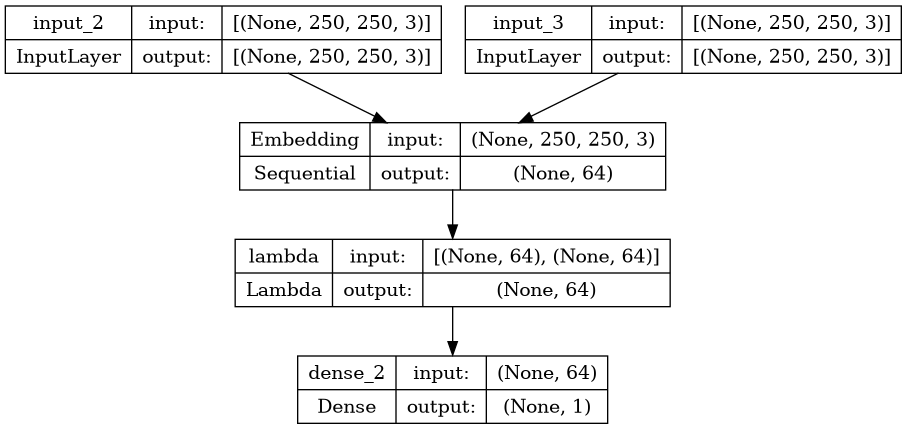

In [22]:
plot_model(siamese, show_shapes=True, show_layer_names=True)

In [23]:
BATCH_SIZE = 32
EPOCHS = 50

train_generator = pair_generator(pairs_train, labels_train, BATCH_SIZE)
validation_generator = pair_generator(pairs_val, labels_val, BATCH_SIZE)

In [24]:
history = siamese.fit(
    train_generator,
    steps_per_epoch=len(pairs_train) // BATCH_SIZE,
    validation_data=validation_generator,
    validation_steps=len(pairs_val) // BATCH_SIZE,
    epochs=EPOCHS
)

Epoch 1/50
401/401 [==============================] - 397s 957ms/step - loss: 0.2522 - accuracy: 0.5974 - val_loss: 0.2082 - val_accuracy: 0.6793
Epoch 2/50
401/401 [==============================] - 314s 784ms/step - loss: 0.2081 - accuracy: 0.6754 - val_loss: 0.1822 - val_accuracy: 0.7155
Epoch 3/50
401/401 [==============================] - 259s 646ms/step - loss: 0.1982 - accuracy: 0.6926 - val_loss: 0.1780 - val_accuracy: 0.7146
Epoch 4/50
401/401 [==============================] - 237s 592ms/step - loss: 0.1872 - accuracy: 0.7173 - val_loss: 0.1801 - val_accuracy: 0.7204
Epoch 5/50
401/401 [==============================] - 244s 609ms/step - loss: 0.1780 - accuracy: 0.7321 - val_loss: 0.1673 - val_accuracy: 0.7377
Epoch 6/50
401/401 [==============================] - 241s 603ms/step - loss: 0.1738 - accuracy: 0.7417 - val_loss: 0.1638 - val_accuracy: 0.7484
Epoch 7/50
401/401 [==============================] - 238s 595ms/step - loss: 0.1704 - accuracy: 0.7479 - val_loss: 0.1851 -

In [25]:
def plt_metric(history, metric, title, has_valid=True):
    """Plots the given 'metric' from 'history'.

    Arguments:
        history: history attribute of History object returned from Model.fit.
        metric: Metric to plot, a string value present as key in 'history'.
        title: A string to be used as title of plot.
        has_valid: Boolean, true if valid data was passed to Model.fit else false.

    Returns:
        None.
    """
    plt.plot(history[metric])
    if has_valid:
        plt.plot(history["val_" + metric])
        plt.legend(["train", "validation"], loc="upper left")
    plt.title(title)
    plt.ylabel(metric)
    plt.xlabel("epoch")
    plt.show()

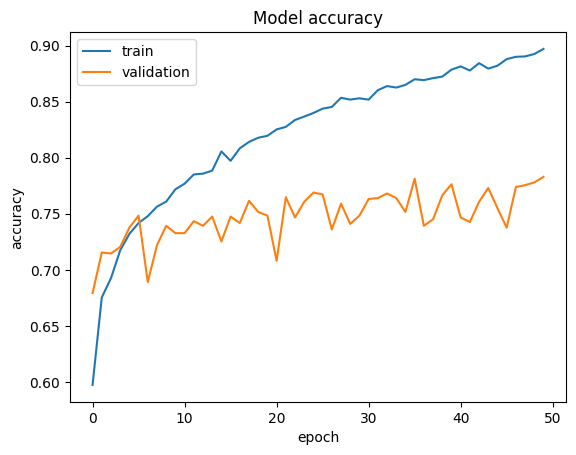

In [26]:
# Plot the accuracy
plt_metric(history=history.history, metric="accuracy", title="Model accuracy")

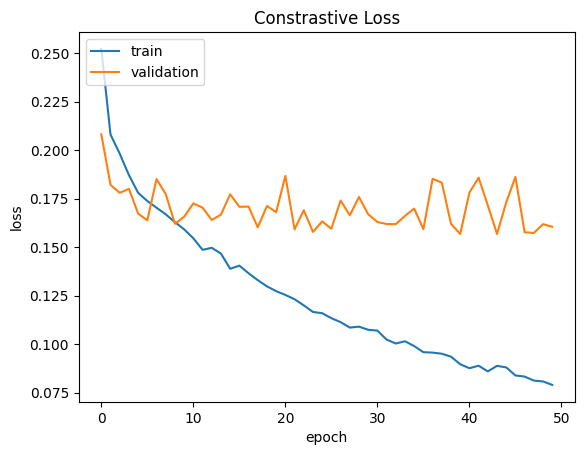

In [27]:
# Plot the constrastive loss
plt_metric(history=history.history, metric="loss", title="Constrastive Loss")

In [28]:
test_generator = pair_generator(pairs_test, labels_test, BATCH_SIZE)
test_loss, test_accuracy = siamese.evaluate(test_generator, steps=len(pairs_test) // BATCH_SIZE)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}")

39/39 [==============================] - 27s 706ms/step - loss: 0.1688 - accuracy: 0.7612
Test Loss: 0.16884000599384308, Test Accuracy: 0.7612179517745972


In [29]:
from tensorflow.keras.models import load_model

# Assuming siamese is your Siamese model
siamese.save('siamese_model.keras')

In [30]:
siamese.save('siamese_model.h5')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [31]:
#predictions = siamese.predict([[pairs_test[i][0] for i in range(len(pairs_test))]
#                               ,[pairs_test[i][1] for i in range(len(pairs_test))]])
#visualize(pairs_test, labels_test, to_show=3, predictions=predictions, test=True)

In [32]:
#gg = [pairs_test[i][0] for i in range(len(pairs_test))]
#wp = [pairs_test[i][1] for i in range(len(pairs_test))]

In [33]:
# Generate a batch of pairs
#pairs_batch, labels_batch = next(pair_generator(pairs_test, labels_test, batch_size=10))

# Predict
#predictions = siamese.predict([np.array([pair[0] for pair in pairs_batch]), 
#                               np.array([pair[1] for pair in pairs_batch])])

# Visualize the predictions along with the true labels using the new function
#visualize_arrays(pairs_batch, labels_batch, predictions=predictions, to_show=10, num_col=3, test=True)

In [34]:
# Generate a batch of pairs
#pairs_batch, labels_batch = next(pair_generator(pairs_test, labels_test, batch_size=1))

# Predict
#predictions = siamese.predict(pairs_batch)

# Optionally: perform further analysis, visualize results, calculate additional metrics, etc.
